# Analysis of data from first dataset Stage35s

### Import Packages

In [1]:
# Import packages
import pandas as pd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import scipy.sparse
import os
import sys
from importlib import reload
#import pdfkit as pdf
#import bbknn
import pickle


# Add path to custom local functions
sys.path.append('/home/pourquielab/Desktop/backup/datachicken')
#sys.path.append('../scTools_190411/')
import scTools_dew as dew

/home/pourquielab/miniconda2/envs/py6/lib/python3.6/site-packages/scanpy/api/__init__.py:6: FutureWarning: 

In a future version of Scanpy, `scanpy.api` will be removed.
Simply use `import scanpy as sc` and `import scanpy.external as sce` instead.

  FutureWarning


In [2]:
# Load/reload custom functions
dew = reload(dew)

In [3]:
# ScanPy settings
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=120)  # low dpi (dots per inch) yields small inline figures
sc.logging.print_versions()

# Matplotlib settings
plt.rcParams['pdf.fonttype']=42  # Necessary to export text (rather than curves) in pdf files

scanpy==1.4.4 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.3 scipy==1.3.2 pandas==0.25.3 scikit-learn==0.21.3 statsmodels==0.10.2 python-igraph==0.8.2 louvain==0.6.1


### Import Libraries

_________________ 35s1
Loading from npz file
(4449, 13309) 

_________________ 35s2
Loading from npz file
(4415, 13309) 



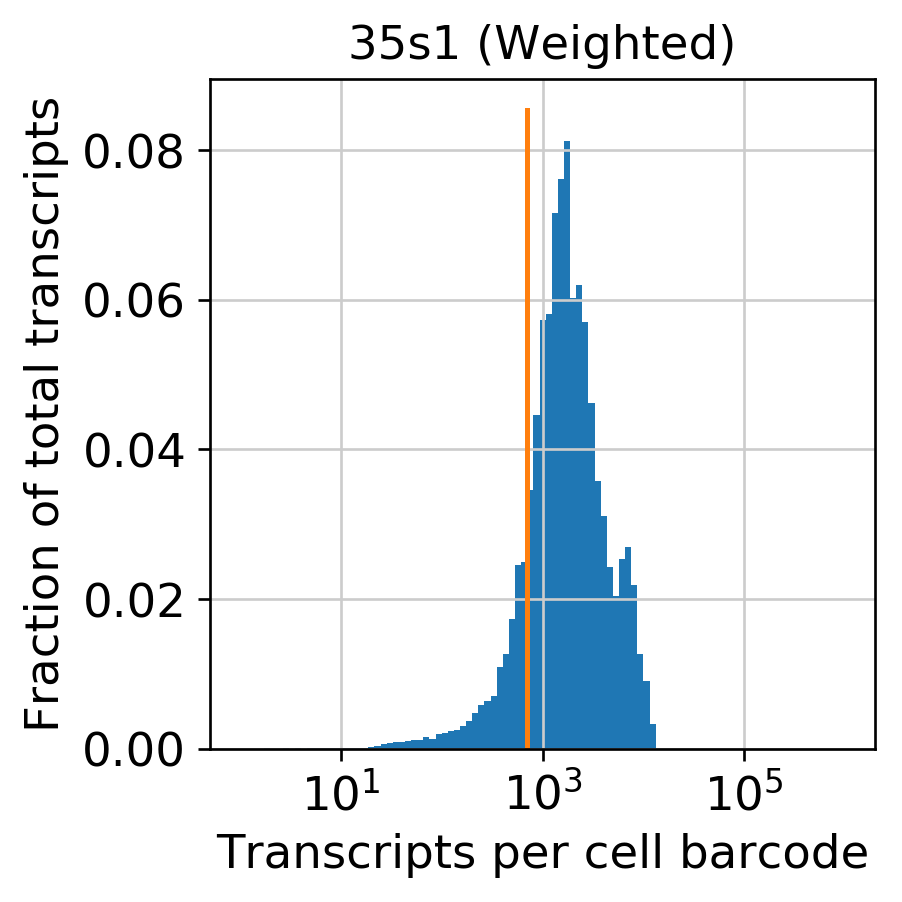

Filtering barcodes for 35s1  ( 1789 / 4449 )
filtered out 2660 cells that haveless than 700 counts


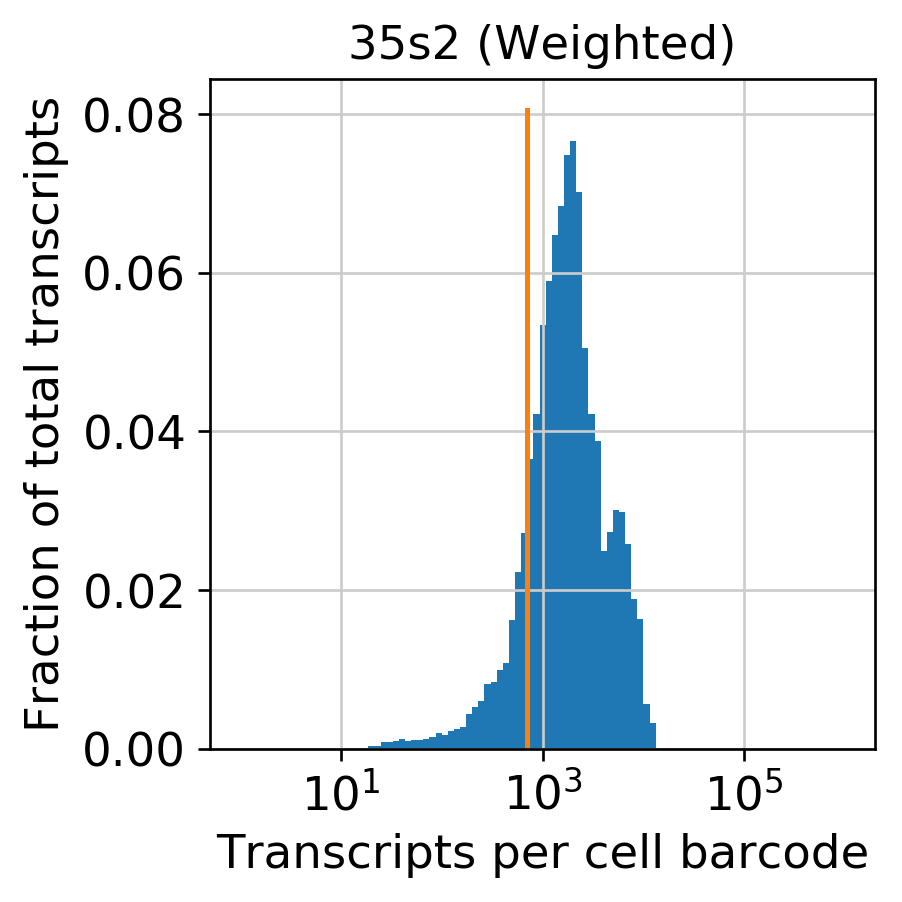

Filtering barcodes for 35s2  ( 1892 / 4415 )
filtered out 2523 cells that haveless than 700 counts

 AnnData object with n_obs × n_vars = 3681 × 13309 
    obs: 'batch', 'cell_names', 'library_id', 'n_counts', 'unique_cell_id'


In [4]:
# load libraries
#input_path = '/Users/dan/Dropbox (HMS)/Data/inDrops/OP_Oscillations/' # full path to all inDrops datasets
input_path = '/home/pourquielab/Desktop/backup/datachicken/' # full path to all inDrops datasets
libnames_gg_35s = ['35s1', '35s2']
gg_35s = dew.load_inDrops_V3(libnames_gg_35s, input_path)

# set barcode abundance threshold
#gg_35s['st41']['adata'].uns['counts_thresh'] = 400
#gg_35s['st42']['adata'].uns['counts_thresh'] = 400
#gg_35s['st51']['adata'].uns['counts_thresh'] = 600
#gg_35s['st52']['adata'].uns['counts_thresh'] = 600
#gg_35s['3s1']['adata'].uns['counts_thresh'] = 200
#gg_35s['3s2']['adata'].uns['counts_thresh'] = 200
#gg_35s['6s1']['adata'].uns['counts_thresh'] = 350
#gg_35s['6s2']['adata'].uns['counts_thresh'] = 350
gg_35s['35s1']['adata'].uns['counts_thresh'] = 700
gg_35s['35s2']['adata'].uns['counts_thresh'] = 700


# perform filtering
for s in libnames_gg_35s:
    dew.filter_abundant_barcodes(gg_35s[s]['adata']) # filter and save histogram plots to file
    
# merge all libraries    
gg_35s = gg_35s['35s1']['adata'].concatenate(gg_35s['35s2']['adata'])
print('\n',gg_35s)

### Add Library Annotations

In [5]:
# Specify timepoints and samples for each library_id
timepoint_dict = {'d4':['35s1','35s2'],}

sample_dict = {'d4':['35s1','35s2'],}
              

# Invert the dictionaries
timepoint_dict_inv = dict((v,k) for k in timepoint_dict for v in timepoint_dict[k])
sample_dict_inv = dict((v,k) for k in sample_dict for v in sample_dict[k])


# Generate per cell annotations
timepoint_id = []
sample_id = []


for s in gg_35s.obs['library_id']:
    timepoint_id.append(timepoint_dict_inv[s])
    sample_id.append(sample_dict_inv[s])
gg_35s.obs['time_id'] = timepoint_id
gg_35s.obs['sample_id'] = sample_id


### Save AnnData DataSet to File

In [6]:
gg_35s.obs.to_csv('Chicken_obs-35s6-1-2020.csv')


### Process & Normalize

In [7]:
# Perform basic filtering
sc.pp.filter_cells(gg_35s, min_genes=400)
sc.pp.filter_genes(gg_35s, min_cells=3)

# Optional: exclude unwanted genes from filtered gene list so they 
# don't contribute to the 2-D embedding, clustering, etc.

exclude_genes = ['ND1', 'ND2', 'ND4', 'ATP6', 'CYTB', 'COII', 'COX3', 'COX1','ND5','ND3','ND6'
                ,'RPL10A','RPL12','RPL13','RPL14','RPL15','RPL17','RPL21','RPL22','RPL23','RPL27A',
                 'RPL3','RPL32','RPL36','RPL36AL','RPL38','RPL5','RPL6','RPL7A','RPL9','RPN1','RPS10',
                 'RPS11','RPS14','RPS15','RPS17','RPS19','RPS20','RPS24','RPS25','RPS26','RPS27L',
                 'RPS4X','RPS8','RPSAP58','MRPL10','MRPL16','MRPL17','MRPL18','MRPL2','MRPL24',
                 'MRPL28','MRPL3','MRPL33','MRPL35','MRPL39','MRPL40','MRPL43','MRPL54','MRPL57',
                 'MRPL58','MRPL9','MRPS11','MRPS24','MRPS25','MRPS27','MRPS31','MRPS9','RPL19',
                 'RPL22L1','RPL24','RPL30','RPL34','RPL39','RPL7','RPL7L1','RPLP0','RPLP1','RPLP2',
                 'RPS12','RPS13','RPS21','RPS24','RPS27A','RPS28','RPS3A','RPS4X','RPS6','RPS7',
                 'ITGB1BP3','RPL35A','AKT3','TWNK','MEF2A','SLC25A4']
keep_genes = [g for g in gg_35s.var_names if g not in exclude_genes]
gg_35s = gg_35s[:, keep_genes]

# Before doing any further processing, store a logarithmized version of the raw data
gg_35s.raw = sc.pp.log1p(gg_35s, copy=True)

# Save current n_counts as n_counts_pre_norm
gg_35s.obs['n_counts_pre_norm'] = gg_35s.obs['n_counts']

# Perform total counts normalization
sc.pp.normalize_total(gg_35s)

# Logarithmize the data
sc.pp.log1p(gg_35s)

# Identify highly variable genes
sc.pp.highly_variable_genes(gg_35s, n_top_genes=1000)
# Regress out n_counts and percent_mito
sc.pp.regress_out(gg_35s, ['n_counts_pre_norm'])
sc.pp.regress_out(gg_35s, ['library_id'])
# Scale the data
sc.pp.scale(gg_35s)


filtered out 41 cells that haveless than 400 genes expressed
filtered out 1765 genes that are detectedin less than 3 cells
Normalizing counts per cell.
    finished (0:00:00):normalized adata.X
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
regressing out ['n_counts_pre_norm']
    sparse input is densified and may lead to high memory use


... storing 'cell_names' as categorical
... storing 'library_id' as categorical
... storing 'unique_cell_id' as categorical
... storing 'time_id' as categorical
... storing 'sample_id' as categorical


    finished (0:00:36)
regressing out ['library_id']
    finished (0:00:35)


calculating cell cycle phase
computing score 'S_score'
    finished (0:00:00)
computing score 'G2M_score'
    finished (0:00:00)
-->     'phase', cell cycle phase (adata.obs)
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 50
    finished (0:00:00)


... storing 'phase' as categorical


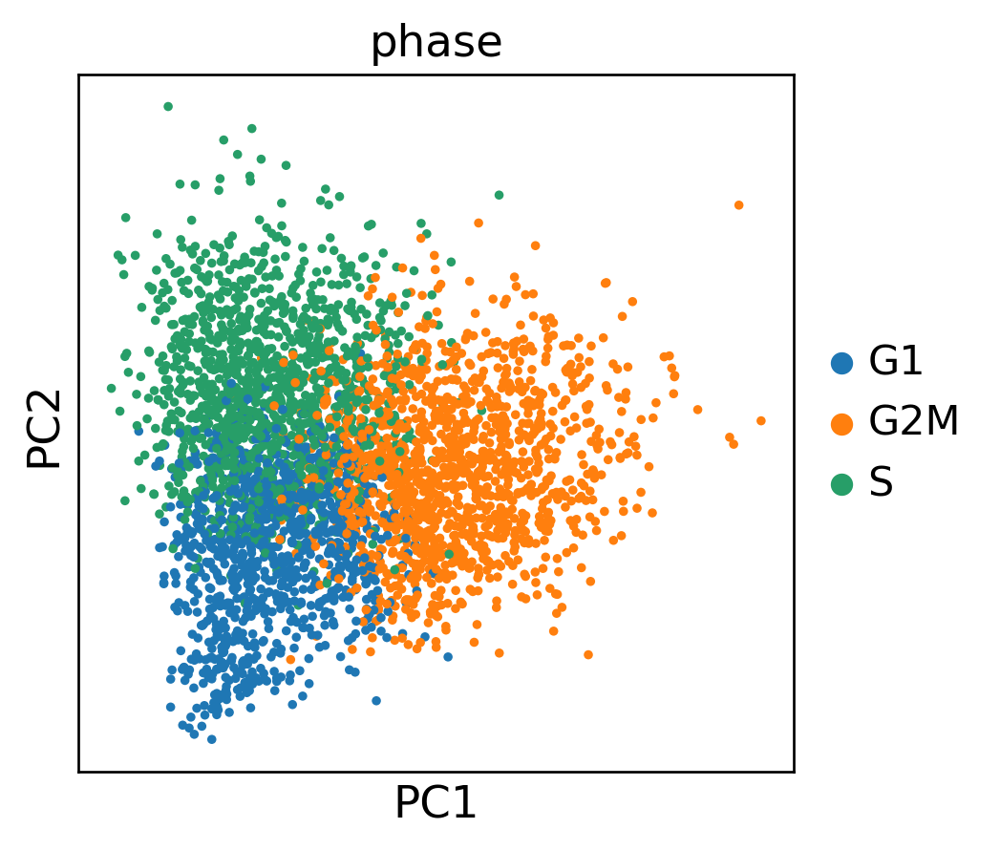

regressing out ['S_score', 'G2M_score']


... storing 'phase' as categorical


    finished (0:01:18)
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 50
    finished (0:00:00)


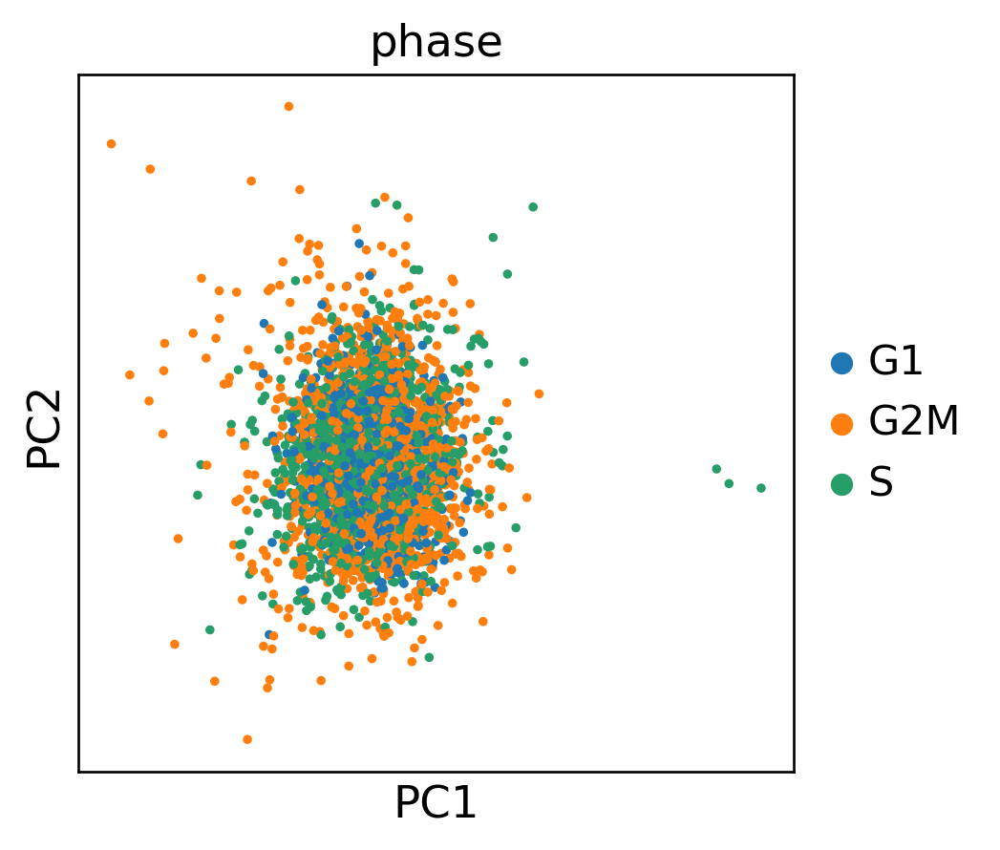

In [8]:
# Need to remove any rows/columns containing all zeros
sc.pp.filter_cells(gg_35s, min_genes=1)
sc.pp.filter_genes(gg_35s, min_cells=1)

# Import cell cycle gene list
cell_cycle_genes = [x.strip() for x in open('./regev_lab_cell_cycle_genes.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in gg_35s.var_names]

# Score cell cycle
sc.tl.score_genes_cell_cycle(gg_35s, s_genes=s_genes, g2m_genes=g2m_genes)

# Visualize cell cycle PCA trends
gg_35s_cc_genes = gg_35s[:, cell_cycle_genes]
sc.tl.pca(gg_35s_cc_genes, use_highly_variable=False)
sc.pl.pca_scatter(gg_35s_cc_genes, color='phase')

# Regress out cell cycle
sc.pp.regress_out(gg_35s, ['S_score', 'G2M_score'])
sc.pp.scale(gg_35s)

# Visualize cell cycle PCA trends post-regression
gg_35s_cc_genes = gg_35s[:, cell_cycle_genes]
sc.tl.pca(gg_35s_cc_genes, use_highly_variable=False)
sc.pl.pca_scatter(gg_35s_cc_genes, color='phase')

In [9]:
print('\n',gg_35s)


 AnnData object with n_obs × n_vars = 3640 × 11451 
    obs: 'batch', 'cell_names', 'library_id', 'n_counts', 'unique_cell_id', 'time_id', 'sample_id', 'n_genes', 'n_counts_pre_norm', 'S_score', 'G2M_score', 'phase'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'


In [69]:
#gg_35s.write('datachicken6-1-2020.h5ad', )

TypeError: write_h5ad() got an unexpected keyword argument 'as_dense'

In [4]:
#gg_35s= sc.read('datachicken6-1-2020.h5ad')

### Compute Embeddings

In [10]:
# Perform PCA and construct a batch-balanced neighbor graph
sc.tl.pca(gg_35s, n_comps=50, svd_solver='arpack')
sc.pp.neighbors(gg_35s, n_neighbors=10, n_pcs=50, use_rep='X_pca')
dew.export_to_graphml(gg_35s, filename='Gephi/gg_35s_bb.graphml')

# Compute sklearn-tSNE and UMAP embeddings
#sc.tl.tsne(gg_35s, use_fast_tsne=False, random_state=None) #previously 802 now set to 'None' to get a random tSNE embedding
#sc.tl.umap(gg_35s)


computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:00)
computing neighbors
    finished (0:00:02)
IGRAPH U-W- 3640 59710 --
+ attr: weight (e)
+ edges:
   0 --   20   20   38   38  140  140  149  149  225  225 1782 1782 1792 1792
1851 1851 1938 1938 2254 2254
   1 --   13   13   55   55  201  201  216  216  267  267  270  270  306  306
371  371  385  385  421  421  601  601  718  718  755  755  887  887  948  948
1017 1017 1031 1031 1053 1053 1161 1161 1322 1322 1505 1505 1526 1526 1732
1732 1748 1748 1830 1830 1865 1865 1976 1976 1996 1996 2036 2036 2094 2094
2153 2153 2184 2184 2245 2245 2266 2266 2299 2299 2340 2340 2376 2376 2429
2429 2460 2460 2512 2512 2514 2514 2646 2646 2672 2672 2684 2684 2693 2693
3036 3036 3098 3098 3103 3103 3193 3193 3203 3203 3244 3244 3404 3404 3452
3452 3511 3511 3544 3544 3635 3635
   2 --  124  124  308  308  433  433 1104 1104 1168 1168 1352 1352 1498 1498
2644 2644 2682 2682 2724 2724 2885 2885 3423 3423 3588 3

computing UMAP


/home/pourquielab/miniconda2/envs/py6/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


    finished (0:00:07)


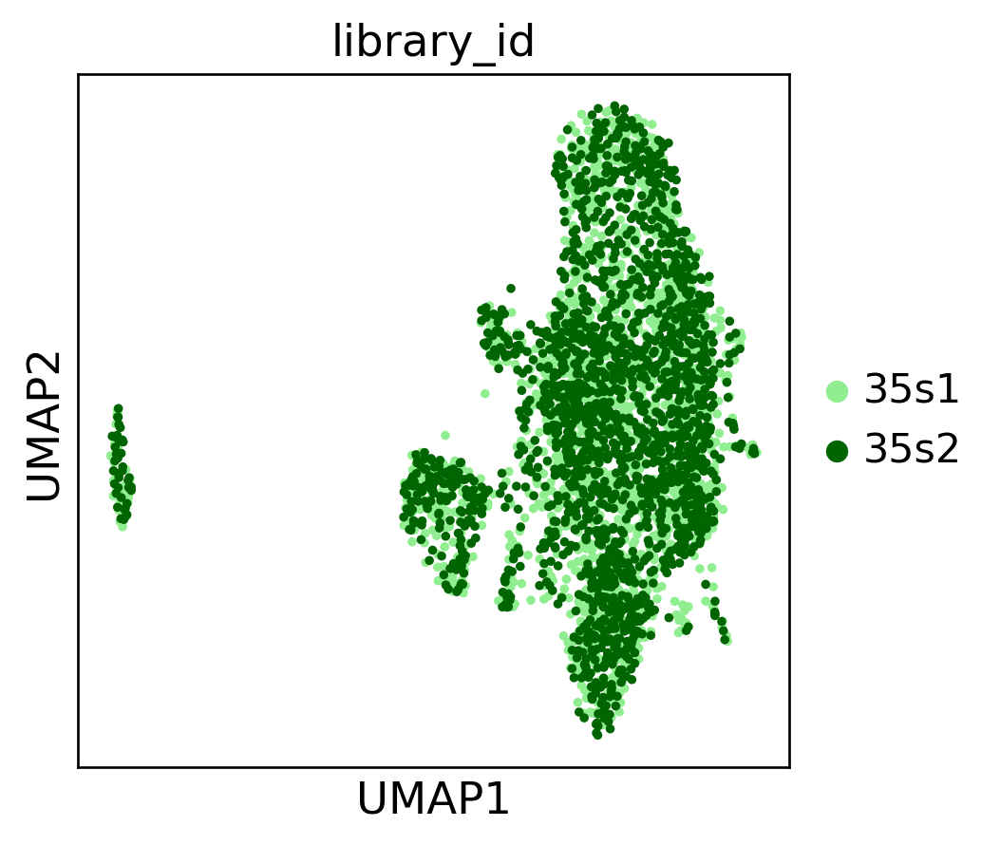

In [58]:
#Compute & plot UMAP
sc.tl.umap(gg_35s)
sc.pl.umap(gg_35s, color=['library_id'], palette=['lightgreen','darkgreen',])

In [80]:
# Print the top enriched genes in each of the clusters
sc.tl.rank_genes_groups(gg_35s, 'leiden', use_raw=True, groups='all', reference='rest', n_genes=1000, 
      method='wilcoxon', corr_method='benjamini-hochberg', log_transformed=True)

ranking genes
    finished (0:00:02)


In [81]:
# Generate a tables of differentially expressed genes for each group
deg = gg_35s.uns['rank_genes_groups']
groups = deg['names'].dtype.names

# Format a table with top 20 gene names only, export to PDFs
for j in range(len(groups)):
    df_names_only = pd.DataFrame({groups : deg[key][groups] for groups in [groups[j]] for key in ['names']}).head(20)
    html_names_only = df_names_only.style.set_table_styles([{'selector': 'th', 'props': [('font-size', '10pt'), ('font-family','Arial'), ('text-align','center'), ('width', '100px')]}]).set_properties(**{'font-size': '10pt', 'font-family': 'Arial', 'text-align': 'center', 'width': '100px'}).set_precision(3).render()
    with open('tables/tmp.html', 'w') as file: file.write(html_names_only)
    #pdf.from_file('tables/tmp.html', 'tables/gg_35s_DEGNames_chicken_'+groups[j]+'.pdf')

# Format a table with top 100 gene names and corrected p-values, export to excel
df_names_pvals = pd.DataFrame({groups+'_'+key: deg[key][groups] for groups in groups for key in ['names', 'pvals','logfoldchanges']}).head(10000)
df_names_pvals.to_csv('tables/gg_35s_DEGTable_louvain_chicken35sfinal.csv')



In [83]:
#save the gene list
Louvain_Cluster=pd.DataFrame(gg_35s.uns['rank_genes_groups']['names'])
#write the saved gene list to a file
Louvain_Cluster.to_csv('/home/pourquielab/Desktop/backup/datachicken/figures/Louvain_Cluster_35sfinal.csv')

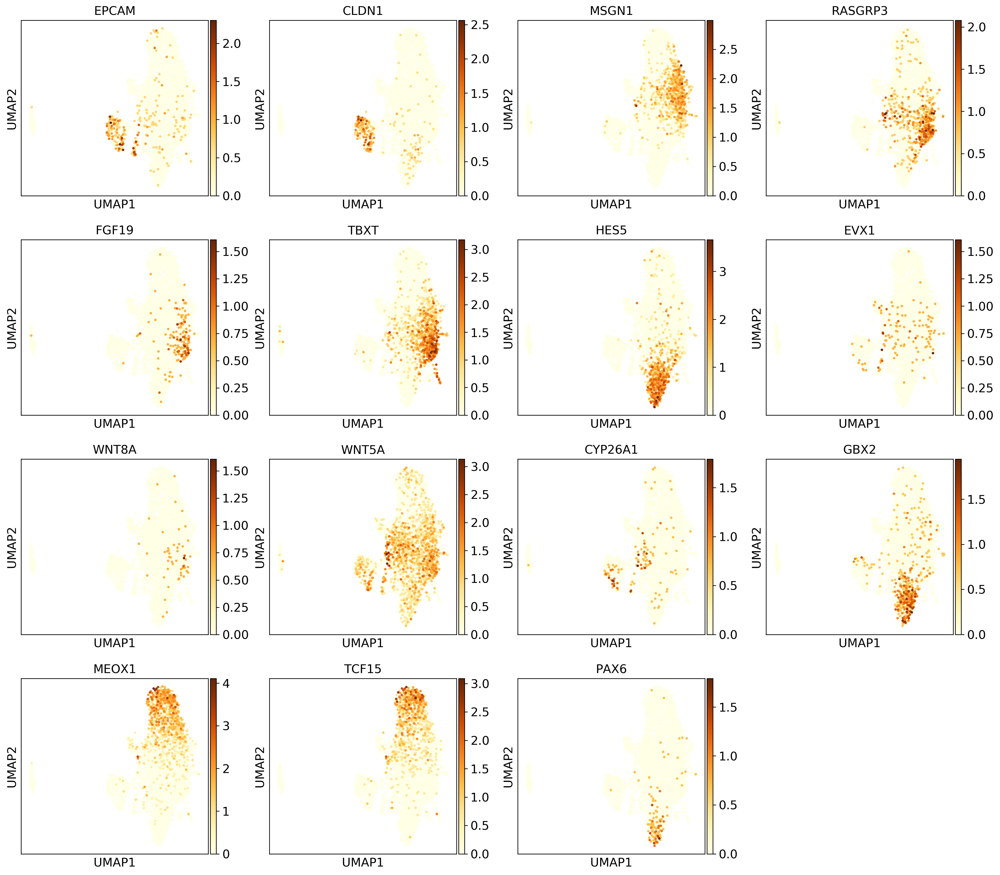

In [12]:
# Overlay genes
sc.pl.umap(gg_35s, color=['EPCAM','CLDN1','MSGN1', 'RASGRP3','FGF19', 'TBXT', 'HES5', 'EVX1','WNT8A','WNT5A','CYP26A1','GBX2','MEOX1','TCF15','PAX6',], cmap='YlOrBr')


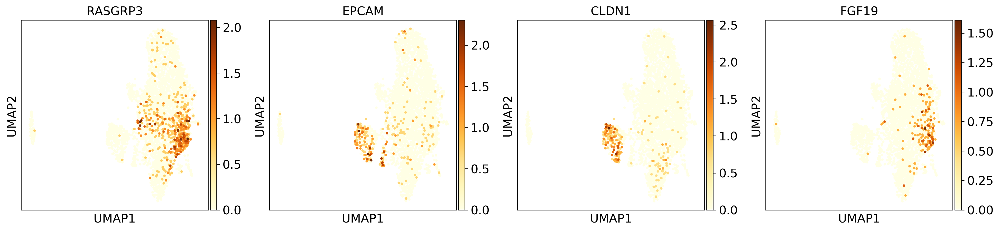

In [13]:
# Overlay genes
sc.pl.umap(gg_35s, color=['RASGRP3','EPCAM','CLDN1','FGF19', ], cmap='YlOrBr')

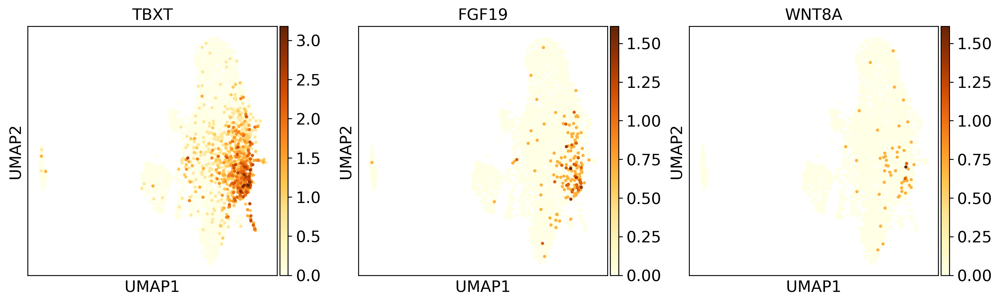

In [14]:
# Overlay genes
sc.pl.umap(gg_35s, color=['TBXT','FGF19','WNT8A' ], cmap='YlOrBr')

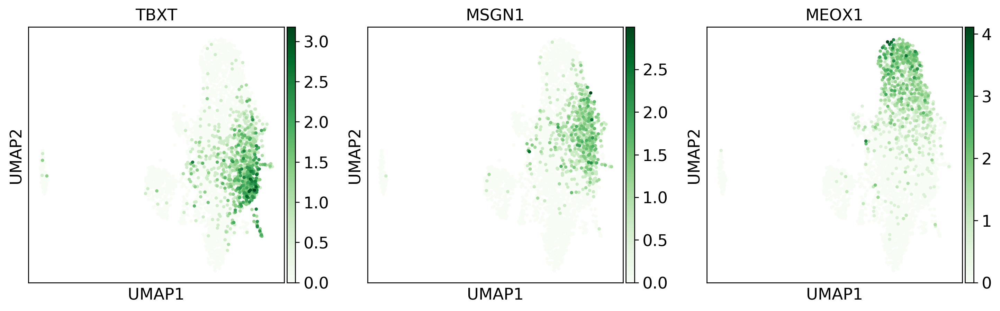

In [15]:
# Overlay genes
sc.pl.umap(gg_35s, color=['TBXT','MSGN1','MEOX1',  ], cmap='Greens')

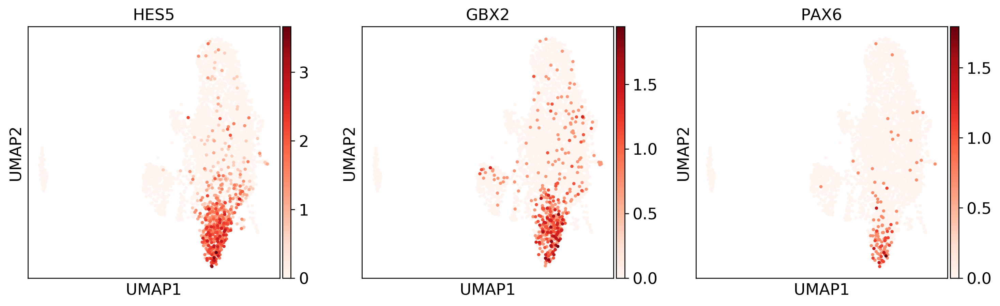

In [16]:
 # Overlay genes
sc.pl.umap(gg_35s, color=['HES5', 'GBX2','PAX6' ], cmap='Reds')

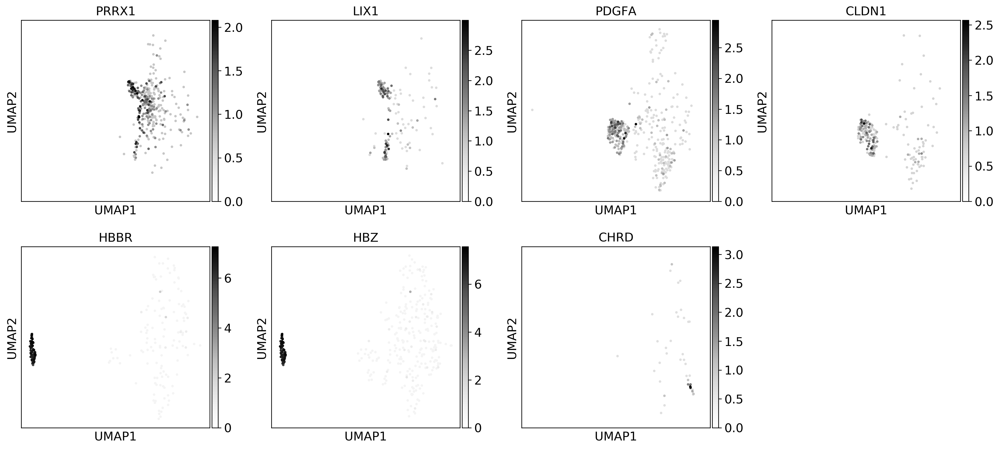

In [17]:

sc.pl.umap(gg_35s, color=['PRRX1','LIX1','PDGFA','CLDN1','HBBR','HBZ','CHRD',], cmap='Greys')

### Perform Clustering

In [19]:
# Leiden and Louvain clustering
sc.tl.leiden(gg_35s, resolution=0.65, use_weights=True)


running Leiden clustering
    finished (0:00:00)


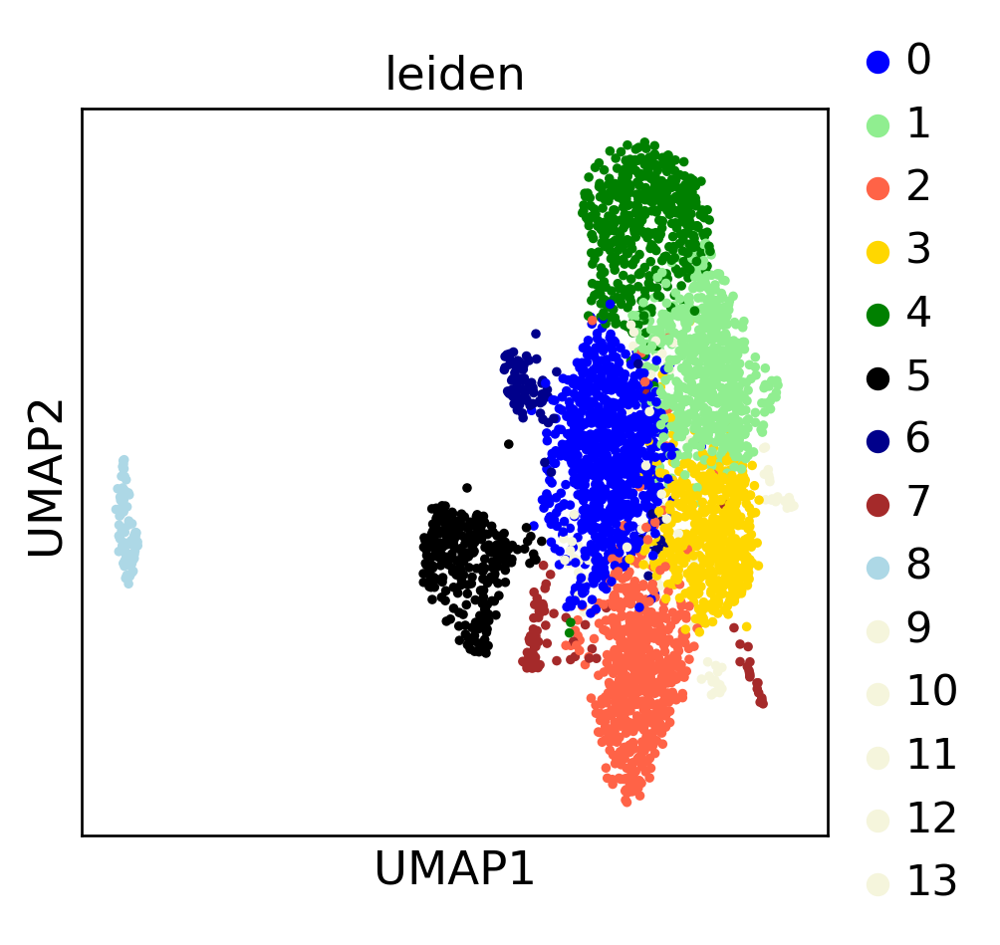

In [21]:
#Plot clusters on UMAP
#sc.tl.umap(gg_35s, )
sc.pl.umap(gg_35s, color=['leiden'], palette=['blue','lightgreen', 'tomato',  'gold', 'green', 'black', 'darkblue', 'brown','lightblue','beige', 'beige', 'beige','beige', 'beige', 'beige','beige', 'beige', 'beige', ])

running PAGA
    finished (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


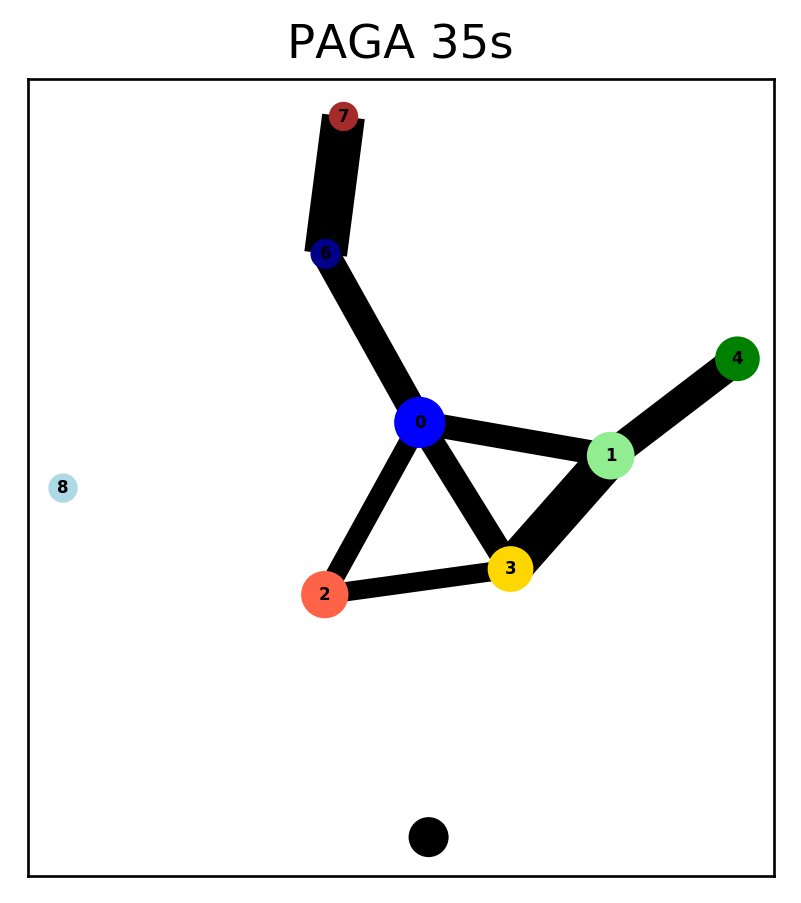

In [70]:
gg_35s_sub = gg_35s[~gg_35s.obs['leiden'].isin(['9','10','11','12', '13','14','15', '16', '17','18']),:]
sc.tl.paga(gg_35s_sub, groups='leiden')
sc.pl.paga(gg_35s_sub, threshold=0.25, edge_width_scale=3, fontsize=5, show=False, title='PAGA 35s')

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         1.         0.9711501  0.9502826  0.94609654 0.9323551
     0.927221   0.9207669  0.9178567  0.90197295 0.89478904 0.88041854
     0.87288314 0.8636828  0.8628606 ]
    finished (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished (0:00:00)


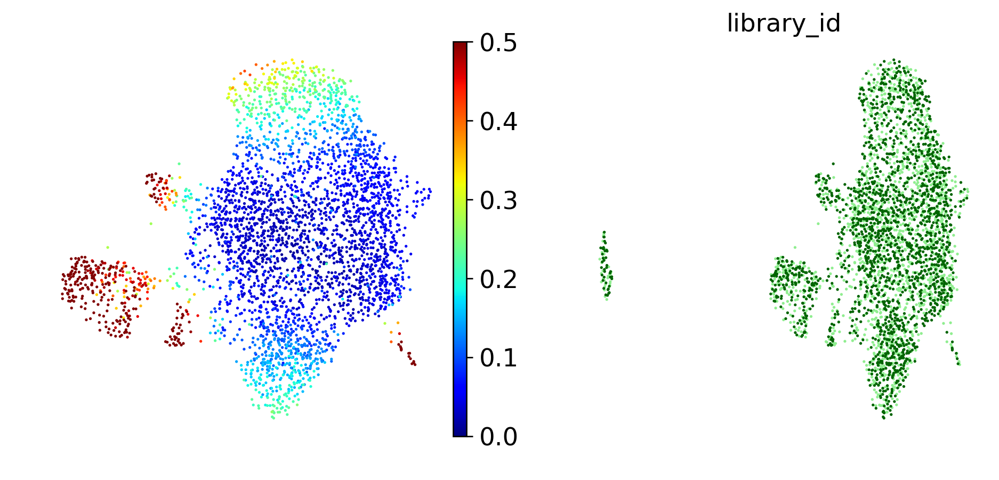

In [72]:

gg_35s_sub.uns['iroot'] = np.flatnonzero(gg_35s_sub.obs['leiden']  == '3')[40]
sc.tl.diffmap(gg_35s_sub,)
sc.tl.dpt(gg_35s_sub)

# T
sc.pl.umap(gg_35s_sub, color=['dpt_pseudotime','library_id'], size=10, cmap='jet', edges=False, frameon=False, title='', legend_loc='none', legend_fontsize=10, legend_fontweight='medium', show=False, vmax=0.5)




/home/pourquielab/miniconda2/envs/py6/lib/python3.6/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


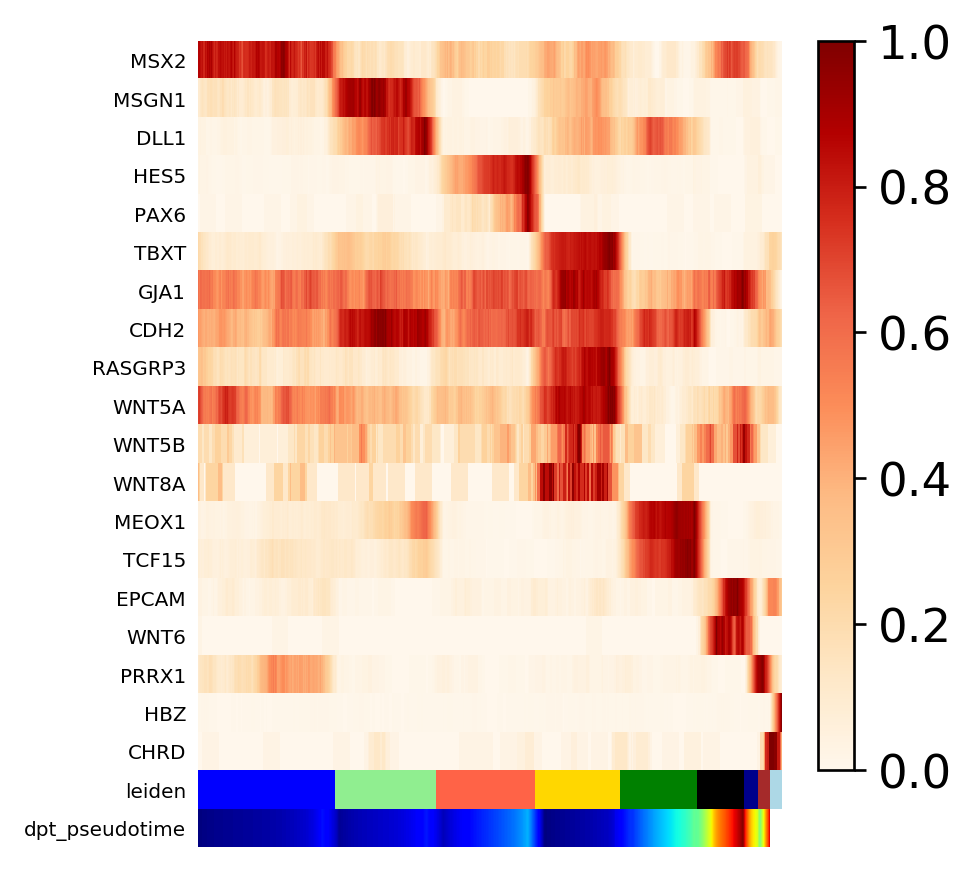

In [73]:
# Plot gene expression trajectories 
traj_nodes = ['0','1','2','3','4','5','6','7','8']
traj_genes = ['MSX2','MSGN1','DLL1', 'HES5','PAX6','TBXT','GJA1','CDH2', 'RASGRP3','WNT5A','WNT5B','WNT8A','MEOX1','TCF15','EPCAM','WNT6','PRRX1','HBZ','CHRD',]
ax = sc.pl.paga_path(gg_35s_sub, nodes=traj_nodes, keys=traj_genes, use_raw=True, annotations=['dpt_pseudotime'],
                     color_map='OrRd', color_maps_annotations={'dpt_pseudotime': 'jet'}, palette_groups=None, 
                     n_avg=100, groups_key=None, xlim=[None, None], title=None, left_margin=None, ytick_fontsize=6, 
                     title_fontsize=None, show_node_names=False, show_yticks=True, show_colorbar=True, legend_fontsize=1, 
                     legend_fontweight=None, normalize_to_zero_one=True, as_heatmap=True, return_data=False, show=True, ax=None)

#plt.savefig('figures/paga_path_marker_genes.png', dpi=2000, bbox_inches='tight')


/home/pourquielab/miniconda2/envs/py6/lib/python3.6/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


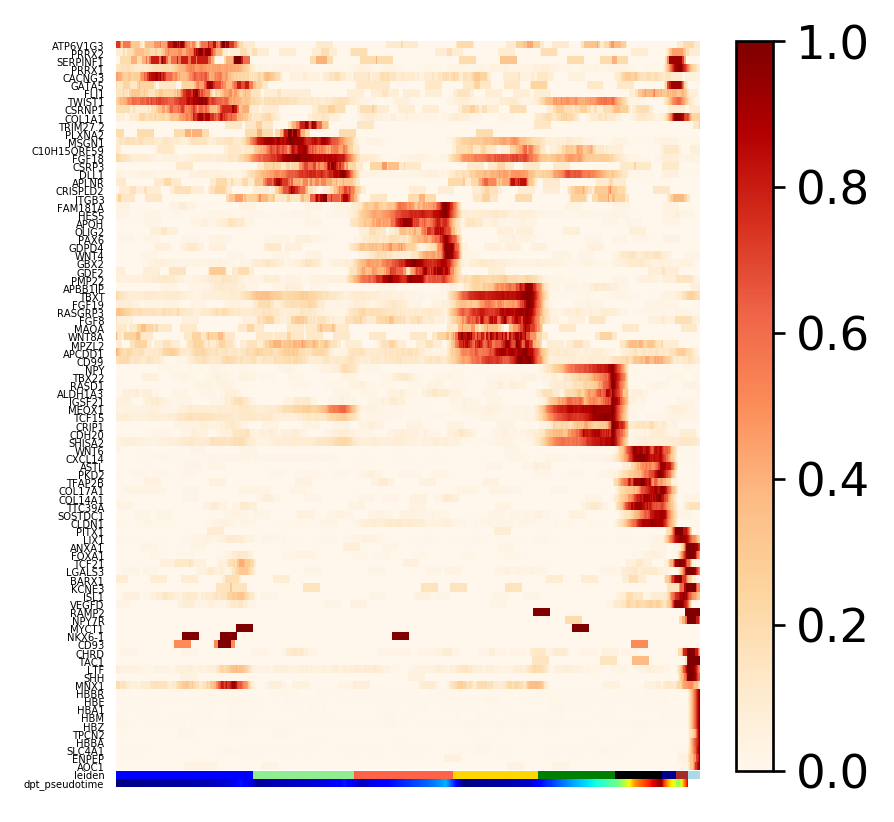

<Figure size 480x480 with 0 Axes>

In [79]:
# Plot gene expression trajectories 
traj_nodes = ['0','1','2','3','4','5','6','7','8']
traj_genes = ['ATP6V1G3','PRRX2','SERPINF1', 'PRRX1','CACNG3','GATA5','FLI1','TWIST1', 'CSRNP1','COL1A1','TRIM27.2','PLXNA2','MSGN1', 'C10H15ORF59','FGF18','CSRP3','DLL1','APLNR', 'CRISPLD2','ITGB3','FAM181A','HES5','APOH', 'OLIG2','PAX6','GDPD4','WNT4','GBX2', 'GDF2','PMP22','APBB1IP','TBXT','FGF19', 'RASGRP3','FGF8','MAOA','WNT8A','MPZL2', 'APCDD1','CD99','NPY','TBX22','RASD1', 'ALDH1A3','IGSF21','MEOX1','TCF15','CRIP1', 'CDH20','SHISA2','WNT6','CXCL14','ASTL', 'PKD2','TFAP2B','COL17A1','COL14A1','TTC39A', 'SOSTDC1','CLDN1','PITX1','LIX1','ANXA1', 'FOXA1','TCF21','LGALS3','BARX1','KCNE3', 'ISL1','VEGFD','RAMP2','NPY7R','MYCT1', 'NKX6-1','CD93','CHRD','TAC1','LTF', 'SHH','MNX1','HBBR','HBE','HBA1', 'HBM','HBZ','TPCN2','HBBA','SLC4A1', 'ENPEP','AOC1']
ax = sc.pl.paga_path(gg_35s_sub, nodes=traj_nodes, keys=traj_genes, use_raw=True, annotations=['dpt_pseudotime'],
                     color_map='OrRd', color_maps_annotations={'dpt_pseudotime': 'jet'}, palette_groups=None, 
                     n_avg=100, groups_key=None, xlim=[None, None], title=None, left_margin=None, ytick_fontsize=3, 
                     title_fontsize=None, show_node_names=False, show_yticks=True, show_colorbar=True, legend_fontsize=1, 
                     legend_fontweight=None, normalize_to_zero_one=True, as_heatmap=True, return_data=False, show=True, ax=None)

plt.savefig('figures/paga_path_marker_genes.jpg', dpi=2000, bbox_inches='tight')


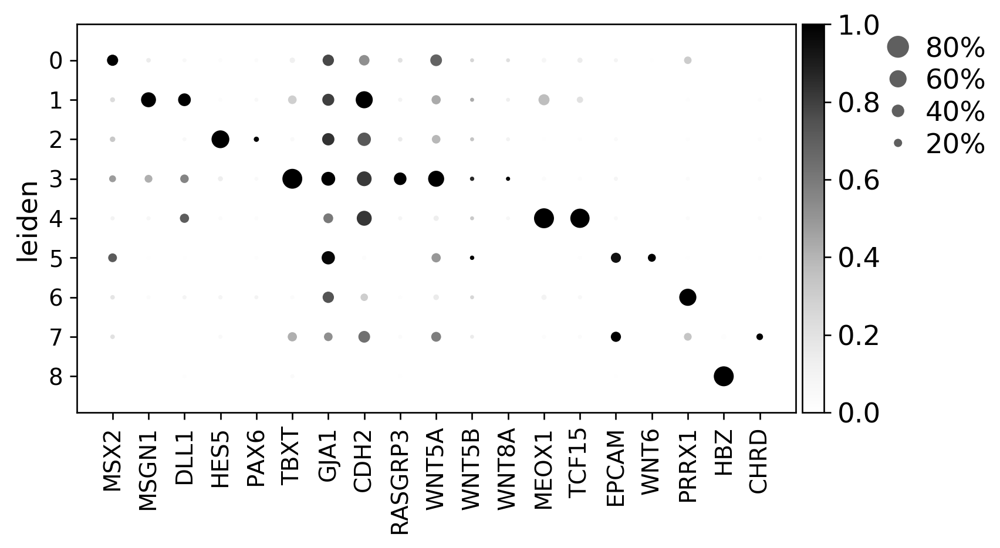

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[6.6499999999999995, 0, 0.2, 0.5, 0.25])

In [27]:
# Generate Dot Plots
mouse_hox=['MSX2','MSGN1','DLL1', 'HES5','PAX6','TBXT','GJA1','CDH2', 'RASGRP3','WNT5A','WNT5B','WNT8A','MEOX1','TCF15','EPCAM','WNT6','PRRX1','HBZ','CHRD',]
# Generate Dot Plots

sc.pl.dotplot(gg_35s_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

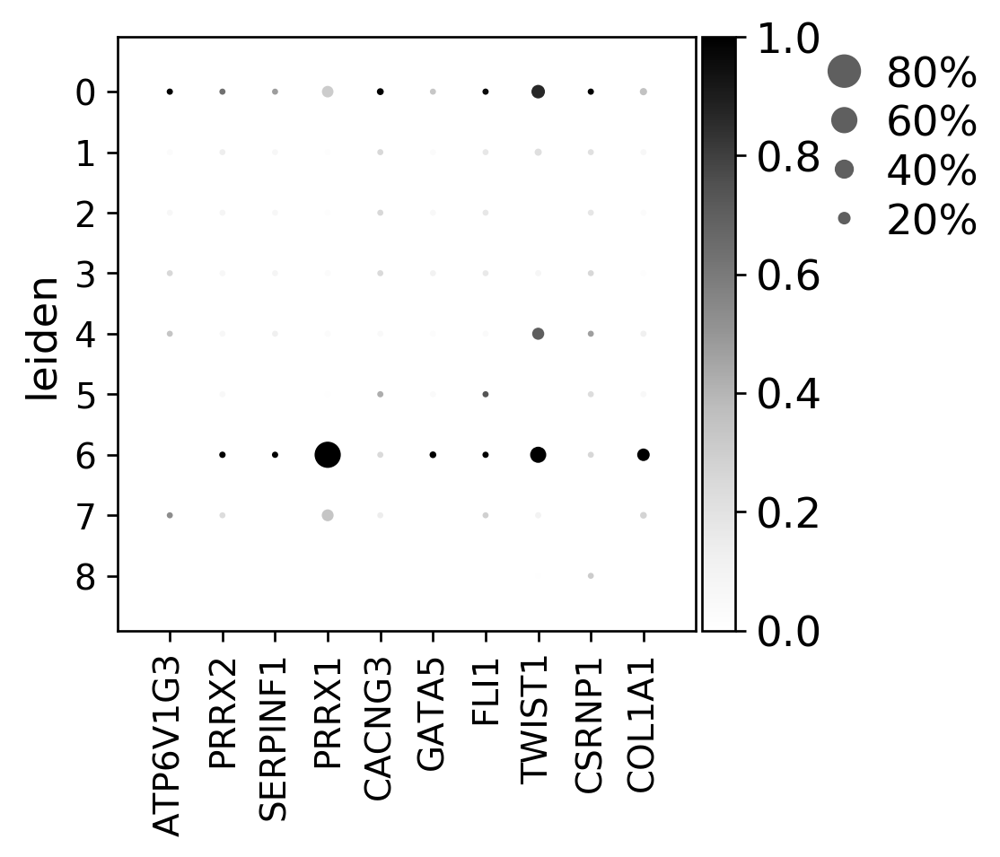

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [28]:
# Generate Dot Plots
mouse_hox=['ATP6V1G3','PRRX2','SERPINF1', 'PRRX1','CACNG3','GATA5','FLI1','TWIST1', 'CSRNP1','COL1A1']
# Generate Dot Plots

sc.pl.dotplot(gg_35s_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

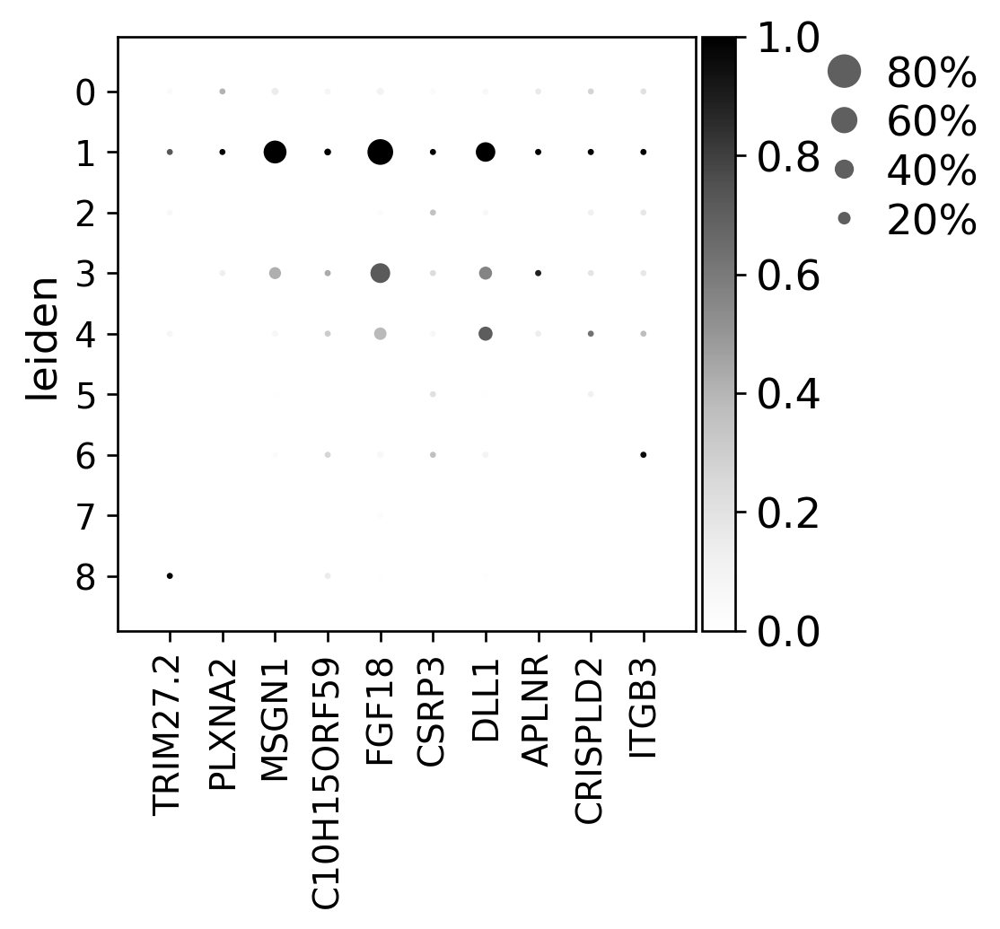

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [29]:
# Generate Dot Plots
mouse_hox=['TRIM27.2','PLXNA2','MSGN1', 'C10H15ORF59','FGF18','CSRP3','DLL1','APLNR', 'CRISPLD2','ITGB3']
# Generate Dot Plots

sc.pl.dotplot(gg_35s_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

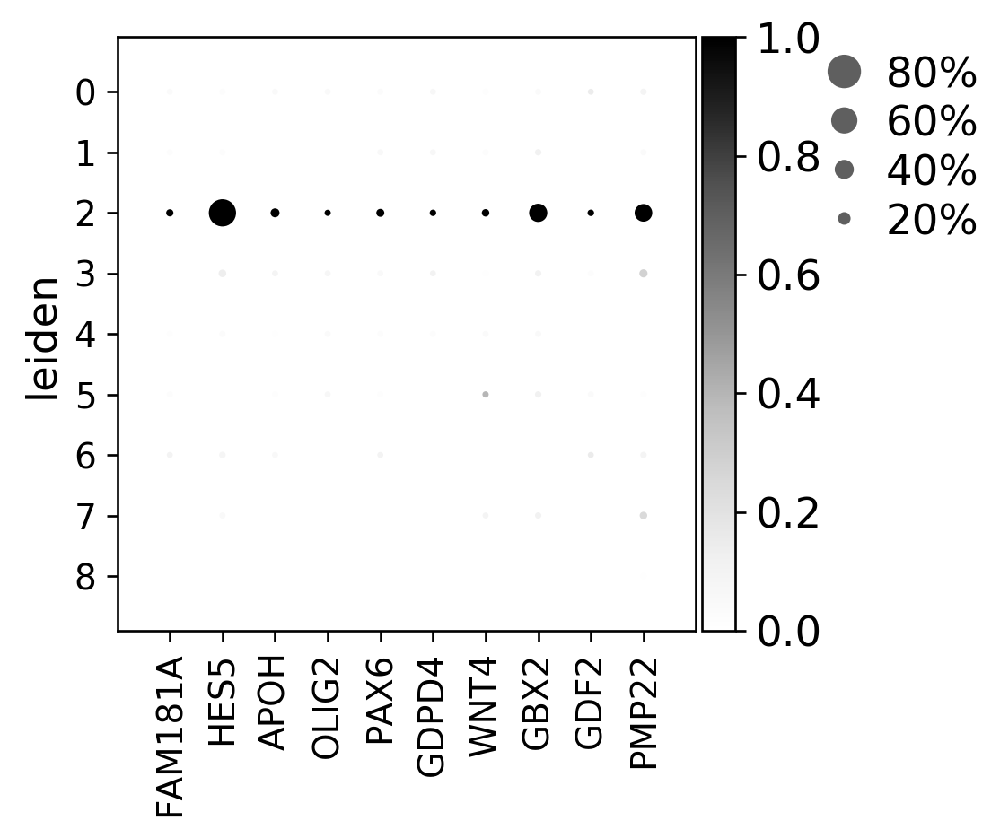

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [30]:
# Generate Dot Plots
mouse_hox=['FAM181A','HES5','APOH', 'OLIG2','PAX6','GDPD4','WNT4','GBX2', 'GDF2','PMP22']
# Generate Dot Plots

sc.pl.dotplot(gg_35s_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

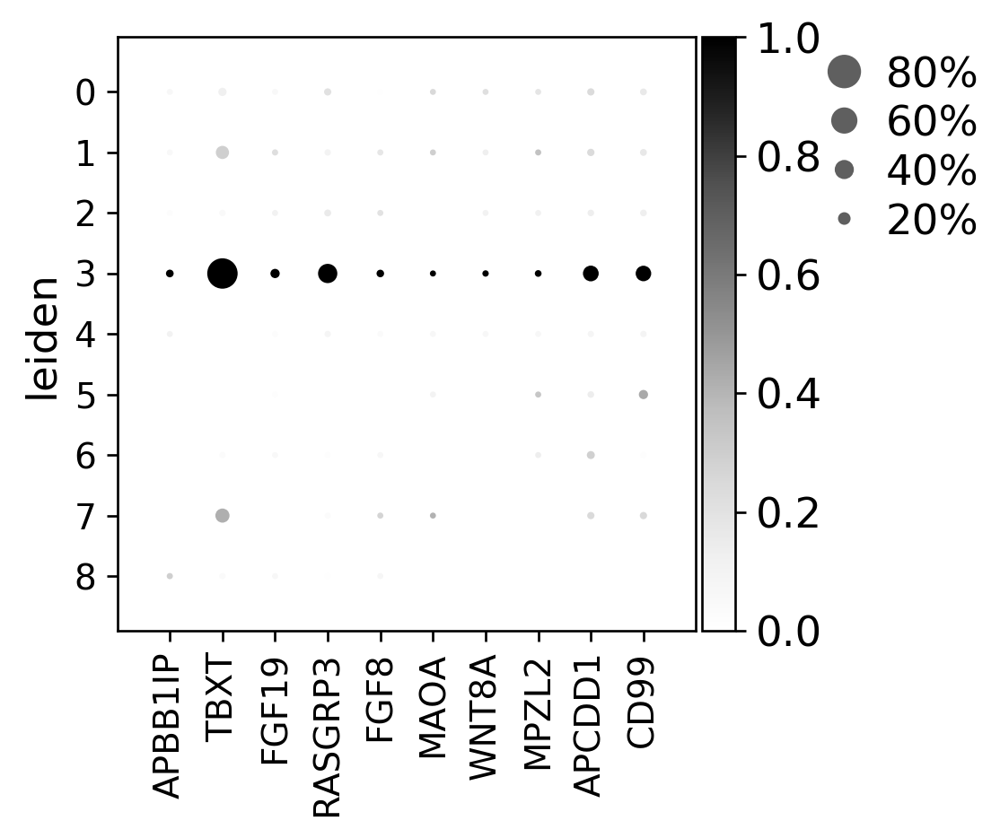

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [31]:
# Generate Dot Plots
mouse_hox=['APBB1IP','TBXT','FGF19', 'RASGRP3','FGF8','MAOA','WNT8A','MPZL2', 'APCDD1','CD99']
# Generate Dot Plots

sc.pl.dotplot(gg_35s_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

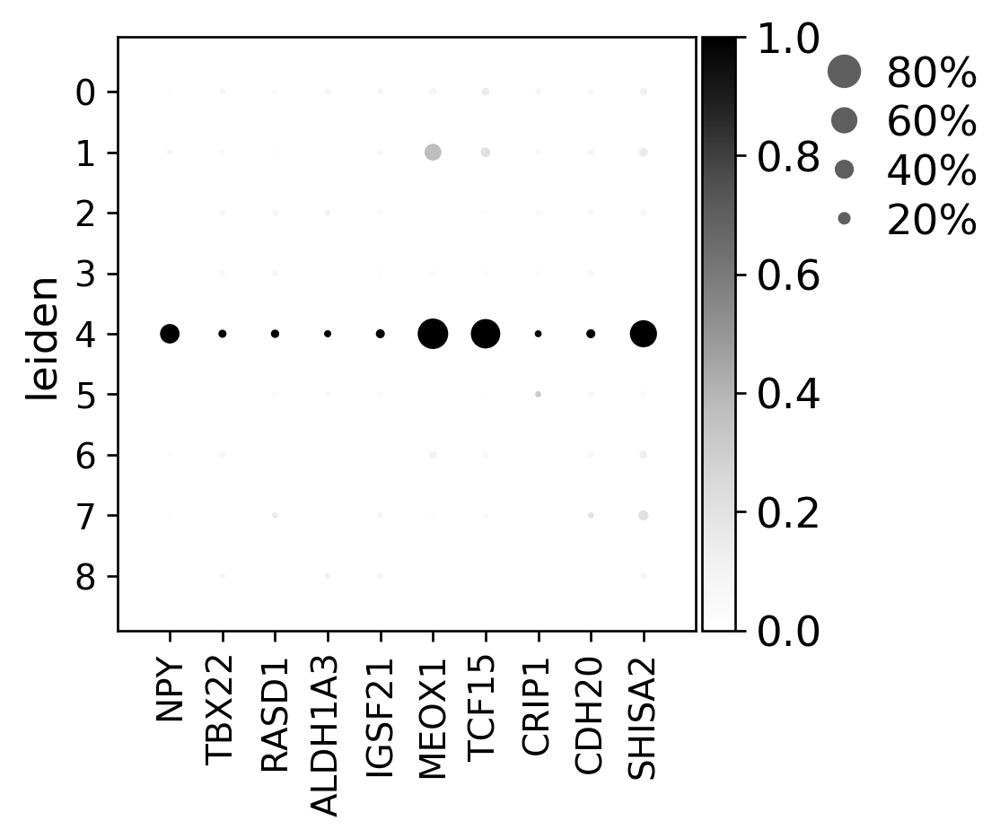

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [32]:
# Generate Dot Plots
mouse_hox=['NPY','TBX22','RASD1', 'ALDH1A3','IGSF21','MEOX1','TCF15','CRIP1', 'CDH20','SHISA2']
# Generate Dot Plots

sc.pl.dotplot(gg_35s_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

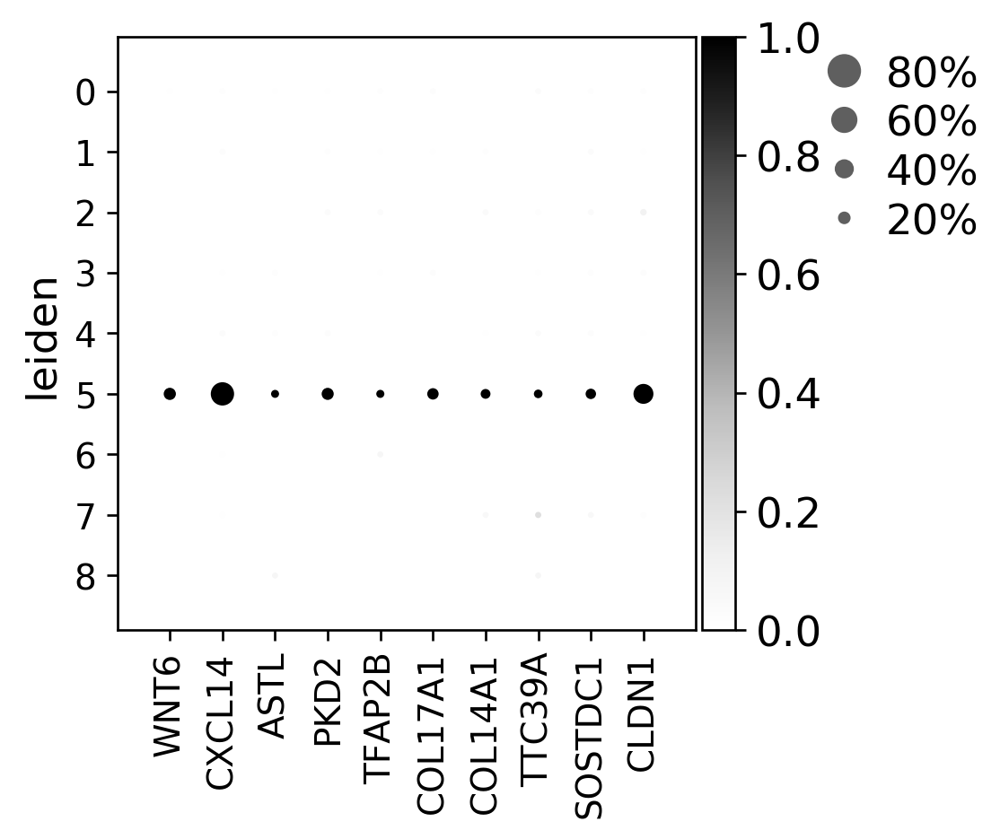

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [33]:
# Generate Dot Plots
mouse_hox=['WNT6','CXCL14','ASTL', 'PKD2','TFAP2B','COL17A1','COL14A1','TTC39A', 'SOSTDC1','CLDN1']
# Generate Dot Plots

sc.pl.dotplot(gg_35s_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

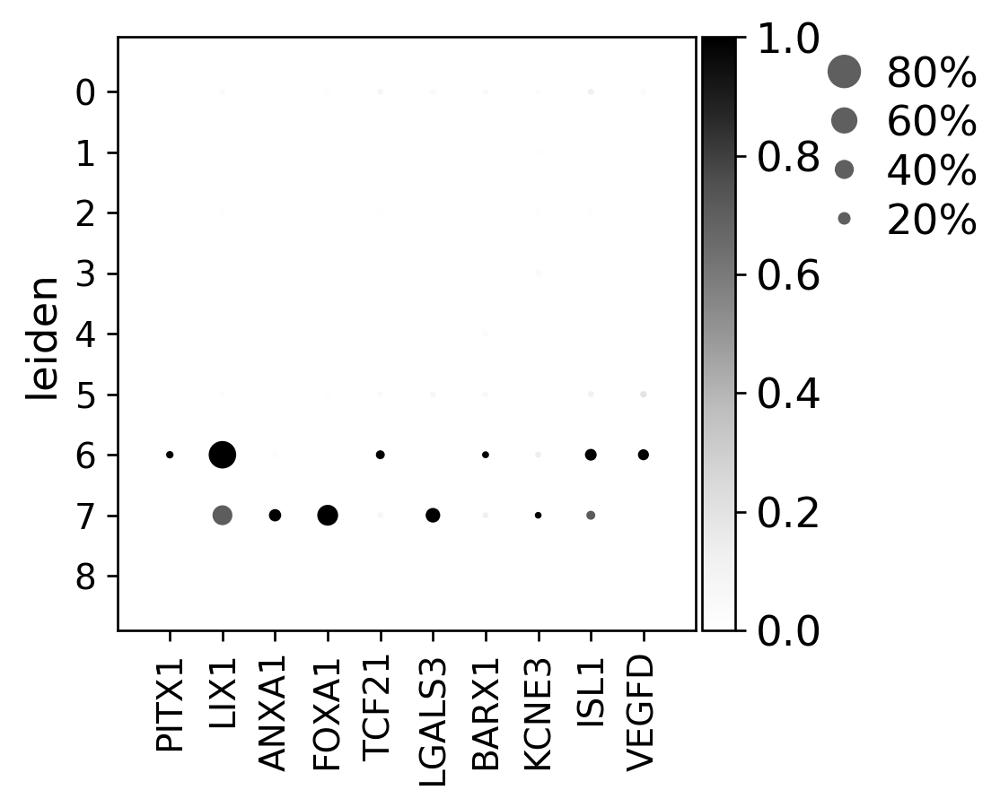

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [34]:
# Generate Dot Plots
mouse_hox=['PITX1','LIX1','ANXA1', 'FOXA1','TCF21','LGALS3','BARX1','KCNE3', 'ISL1','VEGFD']
# Generate Dot Plots

sc.pl.dotplot(gg_35s_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

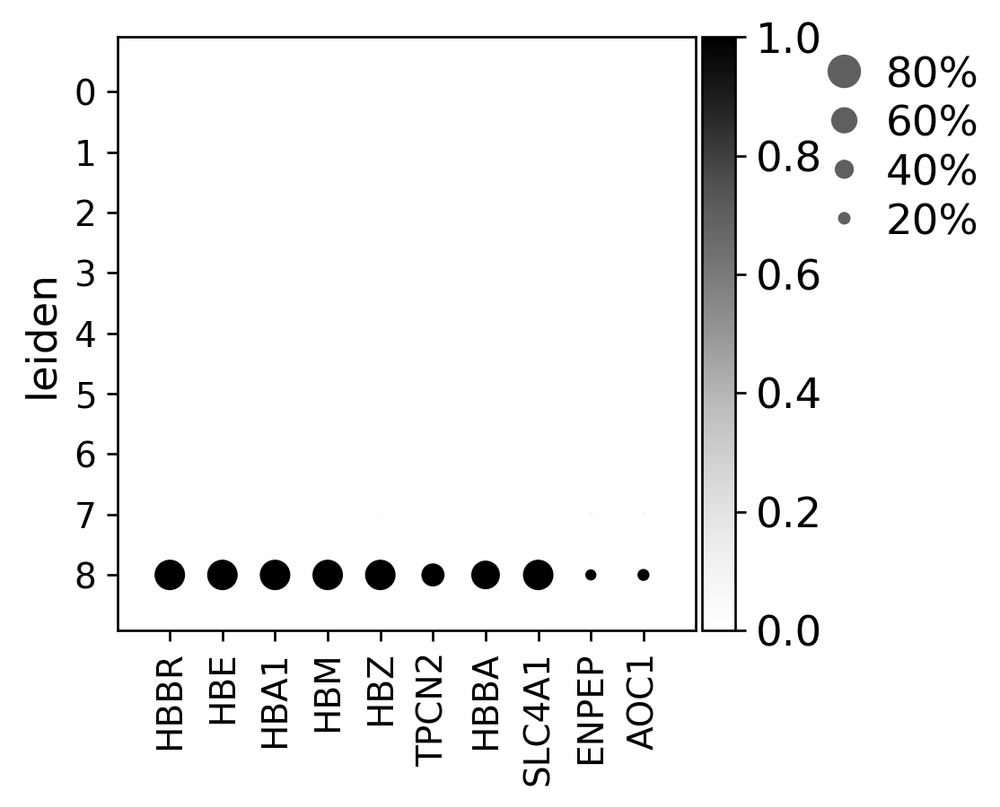

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [35]:
# Generate Dot Plots
mouse_hox=['HBBR','HBE','HBA1', 'HBM','HBZ','TPCN2','HBBA','SLC4A1', 'ENPEP','AOC1']
# Generate Dot Plots

sc.pl.dotplot(gg_35s_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

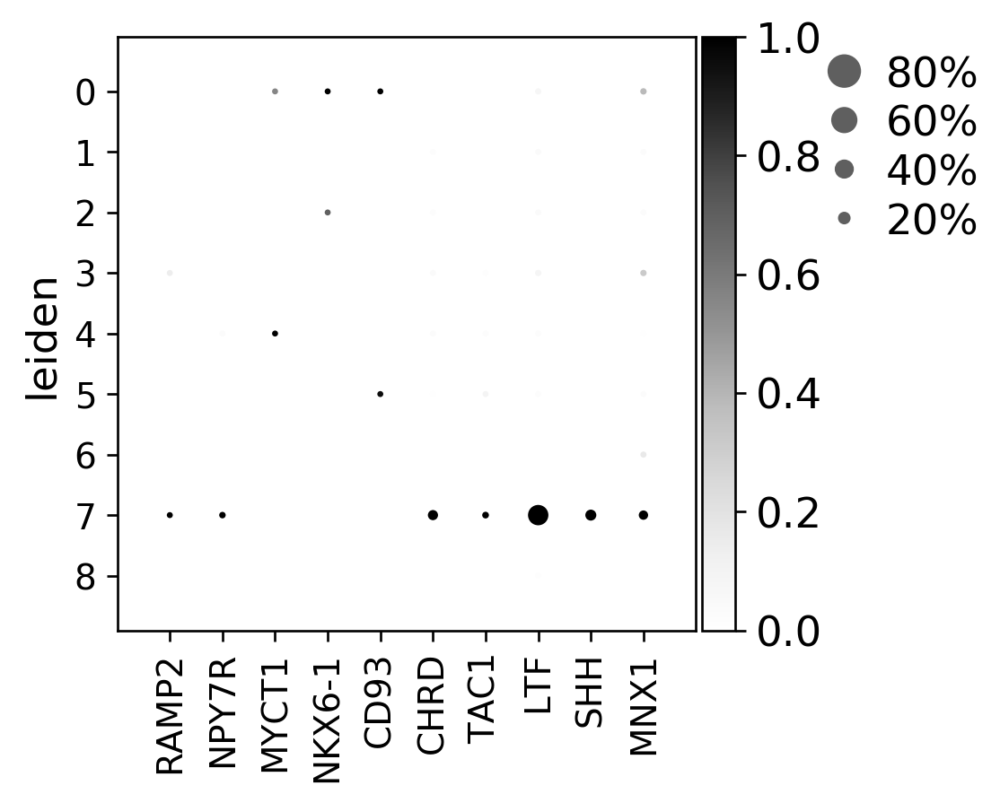

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [36]:
# Generate Dot Plots
mouse_hox=['RAMP2','NPY7R','MYCT1', 'NKX6-1','CD93','CHRD','TAC1','LTF', 'SHH','MNX1']
# Generate Dot Plots

sc.pl.dotplot(gg_35s_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

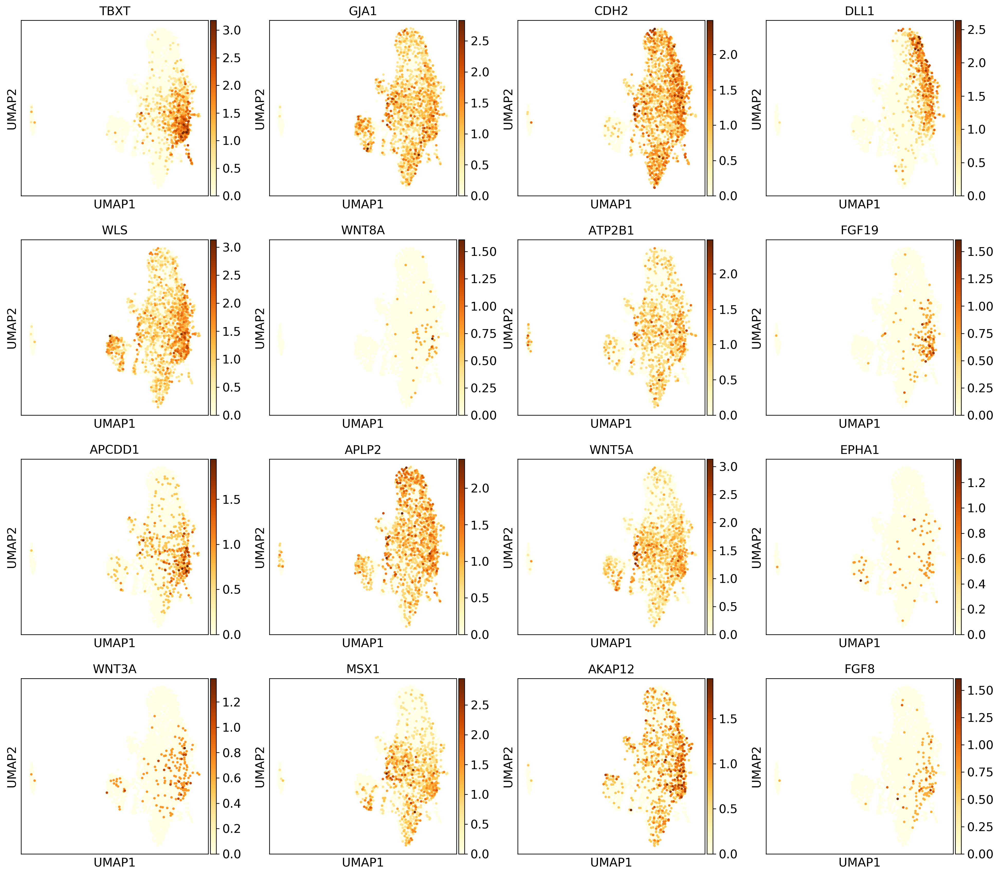

In [37]:
# Overlay genes
sc.pl.umap(gg_35s, color=['TBXT','GJA1','CDH2','DLL1','WLS','WNT8A','ATP2B1','FGF19','APCDD1','APLP2','WNT5A','EPHA1','WNT3A','MSX1','AKAP12','FGF8' ], cmap='YlOrBr')

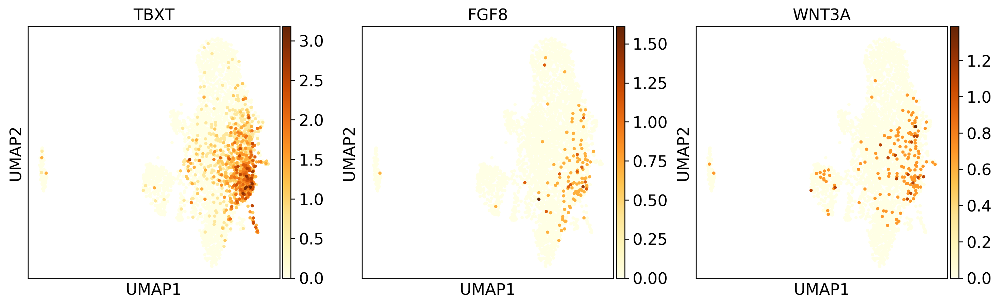

In [38]:
# Overlay genes
sc.pl.umap(gg_35s, color=['TBXT','FGF8','WNT3A', ], cmap='YlOrBr')

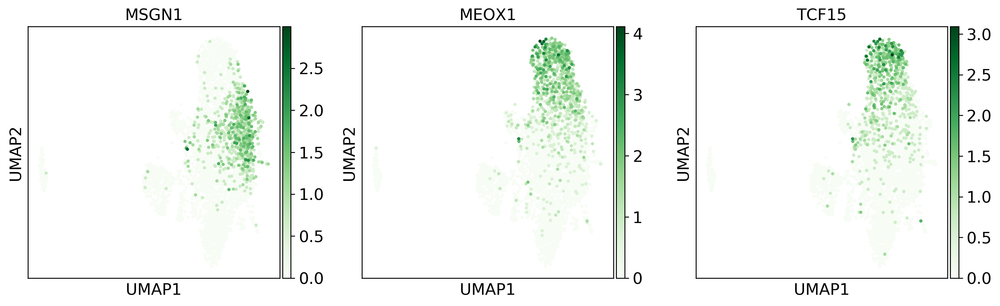

In [39]:
# Overlay genes
sc.pl.umap(gg_35s, color=['MSGN1','MEOX1', 'TCF15' ], cmap='Greens')

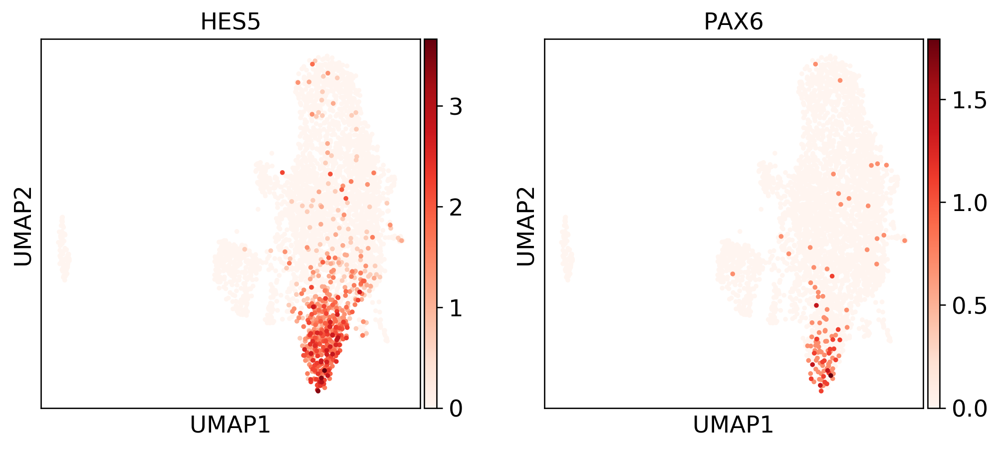

In [40]:
 # Overlay genes
sc.pl.umap(gg_35s, color=['HES5', 'PAX6' ], cmap='Reds')

In [42]:
# here replace the variable by the number of clone or the name of clone if name was attibuted also add _sub if name were edited
print('nCells in 0: '+str(sum(gg_35s.obs['leiden'].isin(['0']))))
print('nCells in 1: '+str(sum(gg_35s.obs['leiden'].isin(['1']))))
print('nCells in 2: '+str(sum(gg_35s.obs['leiden'].isin(['2']))))
print('nCells in 3: '+str(sum(gg_35s.obs['leiden'].isin(['3']))))
print('nCells in 4: '+str(sum(gg_35s.obs['leiden'].isin(['4']))))
print('nCells in 5: '+str(sum(gg_35s.obs['leiden'].isin(['5']))))
print('nCells in 6: '+str(sum(gg_35s.obs['leiden'].isin(['6']))))
print('nCells in 7: '+str(sum(gg_35s.obs['leiden'].isin(['7']))))
print('nCells in 8: '+str(sum(gg_35s.obs['leiden'].isin(['8']))))
print('nCells in 9: '+str(sum(gg_35s.obs['leiden'].isin(['9']))))
print('nCells in 10: '+str(sum(gg_35s.obs['leiden'].isin(['10']))))


nCells in 0: 833
nCells in 1: 617
nCells in 2: 600
nCells in 3: 517
nCells in 4: 467
nCells in 5: 289
nCells in 6: 85
nCells in 7: 73
nCells in 8: 72
nCells in 9: 25
nCells in 10: 23


In [43]:
pd.crosstab(gg_35s.obs['phase'],gg_35s.obs['leiden'])

leiden,0,1,2,3,4,5,6,7,8,9,10,11,12,13
phase,,,,,,,,,,,,,,
G1,225,141,104,115,146,101,26,36,69,9,12,4,5,3
G2M,286,238,277,198,170,110,29,22,0,6,8,7,4,2
S,322,238,219,204,151,78,30,15,3,10,3,4,6,4


running PAGA
    finished (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


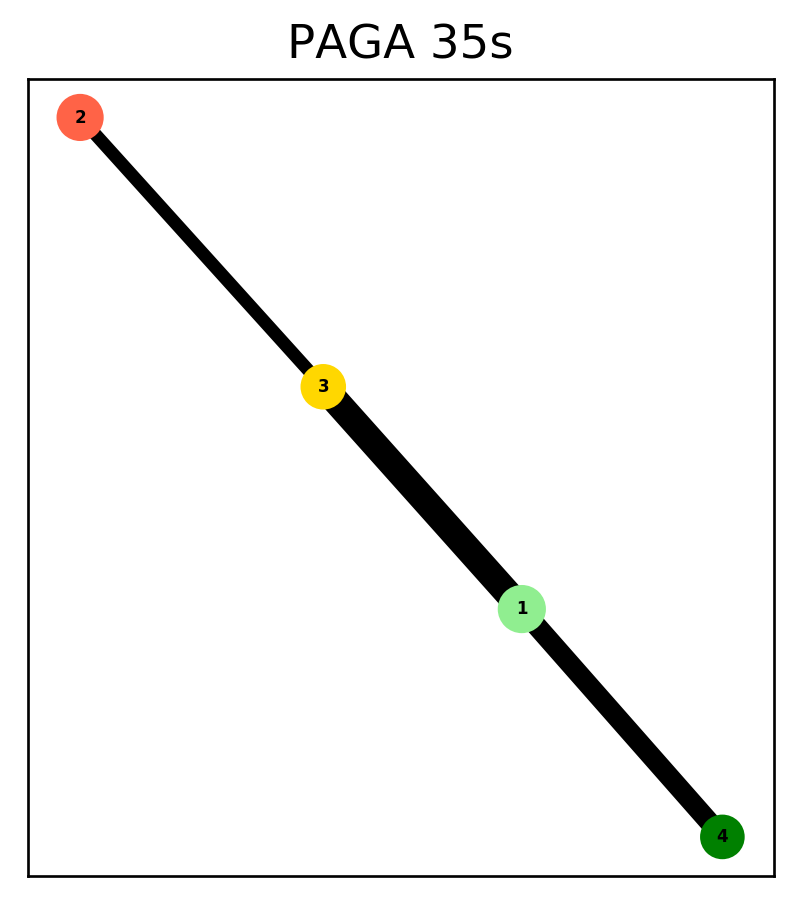

In [37]:
gg_35s_sub = gg_35s[~gg_35s.obs['leiden'].isin(['0','5','Blood','Ectoderm','IM','6','7','8','9','10','11','12', '13','14','15', '16', '17','18']),:]
sc.tl.paga(gg_35s_sub, groups='leiden')
sc.pl.paga(gg_35s_sub, threshold=0.1, edge_width_scale=3, fontsize=5, show=False, title='PAGA 35s')

running PAGA
    finished (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


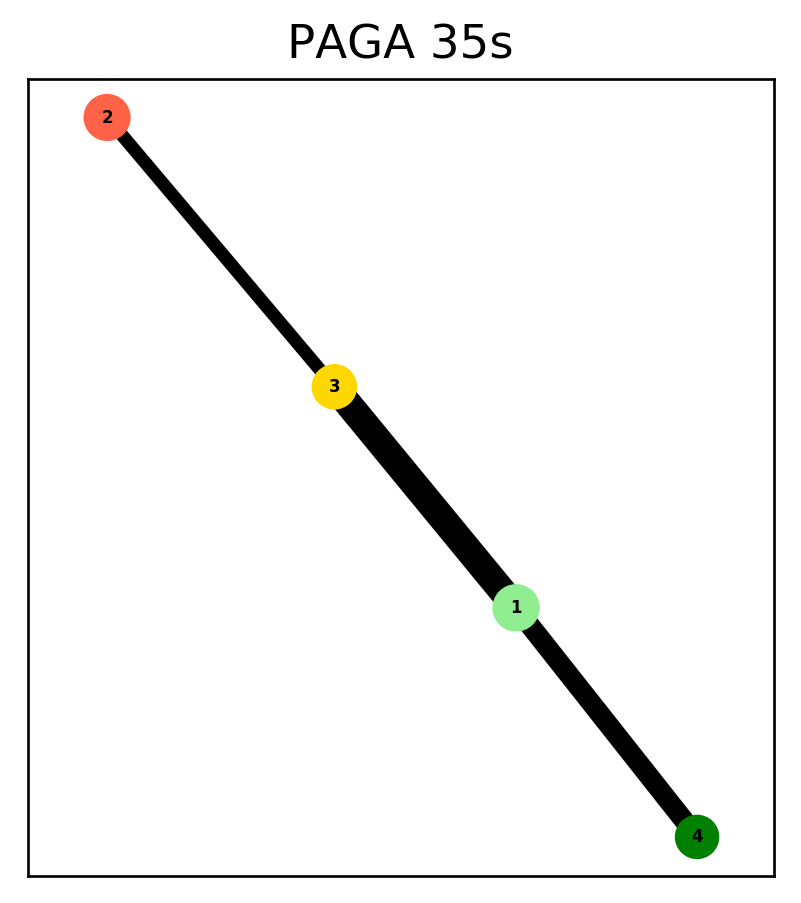

In [46]:
gg_35s_sub2 = gg_35s[~gg_35s.obs['leiden'].isin(['0','LP','Blood','Noto/Endo','Ectoderm','LPlate','LPlate2','LP','5','8','6','7','9','10','11','12', '13','14','15', '16', '17','18']),:]
sc.tl.paga(gg_35s_sub2, groups='leiden')
sc.pl.paga(gg_35s_sub2, threshold=0.1, edge_width_scale=3, fontsize=5, show=False, title='PAGA 35s')

### Save AnnData DataSet to File

In [56]:
#gg_35s.obs.to_csv('datachicken35s_full.csv')
#gg_35s.write('datachicken35s.h5ad')

### Load AnnData DataSet from File

In [61]:
gg_35s = sc.read('datachicken35s.h5ad')
print(gg_35s)

AnnData object with n_obs × n_vars = 3640 × 11451 
    obs: 'batch', 'cell_names', 'library_id', 'n_counts', 'unique_cell_id', 'time_id', 'sample_id', 'n_genes', 'n_counts_pre_norm', 'S_score', 'G2M_score', 'phase', 'leiden'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'leiden', 'leiden_colors', 'library_id_colors', 'neighbors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
